In [59]:
import numpy as np
import os,sys
import math
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as Rot

In [112]:
#Covariance Matrix
Q = np.diag([
    0.1,
    0.1,
    np.deg2rad(1.0),
    1.0
])**2

R = np.diag([1.0, 1.0])**2

In_Noise = np.diag([1.0, np.deg2rad(30.0)])**2
Sensor_Noise = np.diag([0.5, 0.5])**2
del_T = 0.1
Simulation_Time = 80.0

show_animation = True

In [102]:
def control_command():
    v = 1.0
    w = 0.1
    u = np.array([[v], [w]])
    return u

In [103]:
def motion_control(mu, u):
    A = np.array([[1.0,0,0,0],
             [0,1.0,0,0],
             [0,0,1.0,0],
             [0,0,0,10]])
    B = np.array([[del_T*math.cos(mu[2,0]),0],
             [del_T*math.sin(mu[2,0]),0],
             [0,del_T],
             [1.0,0]])

    mu = A @ mu + B @ u 

    return mu


In [104]:
def observation_control(x):
    H = np.array([
        [1,0,0,0],
        [0,1,0,0]
    ])
    
    z = H @ x
    return z

In [105]:
def observation(x_t, x_d, u):
    x_t = motion_control(x_t, u)
    
    z = observation_control(x_t) + Sensor_Noise @ np.random.randn(2,1)
    
    u_d = u + In_Noise @ np.random.randn(2,1)
    
    x_d = motion_control(x_d, u_d)
    
    return x_t, z, x_d, u_d

In [106]:
def jacobian_motion(x , u):
    w = x[2,0]
    v = u[0,0]
    jacob = np.array([
        [1.0,0.0,-del_T*v*math.sin(w), del_T * math.cos(w)],
        [0, 1.0, del_T * v * math.cos(w), del_T *math.sin(w)],
        [0,0,0,0],
        [0,0,0,1.0]
    ])
    return jacob

In [107]:
def jacobian_observation():
    jacob_ob = np.array([
        [1,0,0,0],
        [0,1,0,0]
    ])
    return jacob_ob

In [108]:
def ekf(x_e, p_e,z,u):
    x_pred = motion_control(x_e,u)
    jacob = jacobian_motion(x_e, u)
    pred = jacob @ p_e @ jacob.T + Q
    
    jacob_ob = jacobian_observation()
    z_pred = observation_control(x_pred)
    y = z - z_pred
    
    F = jacob_ob @ pred @ jacob_ob.T + R
    G = pred @ jacob_ob.T @ np.linalg.inv(F)
    x_e = x_pred + G @ y
    p_e = (np.eye(len(x_e)) - G @ jacob_ob) @ pred
    
    return x_e, p_e

In [115]:
def covariance_ellipse(x_e, p_e): 
    x_y = p_e[0:2, 0:2]
    eigval, eigvec = np.linalg.eig(Pxy)

    if eigval[0] >= eigval[1]:
        bigind = 0
        smallind = 1
    else:
        bigind = 1
        smallind = 0

    e = np.arange(0, 2 * math.pi + 0.1, 0.1)
    a = math.sqrt(eigval[bigind])
    b = math.sqrt(eigval[smallind])
    x = [a * math.cos(i) for i in e]
    y = [b * math.sin(i) for i in e]
    angle = math.atan2(eigvec[1, bigind], eigvec[0, bigind])
    rot = Rot.from_euler('z', angle).as_matrix()[0:2, 0:2]
    f_x = np.stack([x, y]).T @ rot
    p_x = np.array(fx[0, :] + x_e[0, 0]).flatten()
    p_y = np.array(fx[1, :] + x_e[1, 0]).flatten()
    plt.plot(p_x, p_y, "--r")


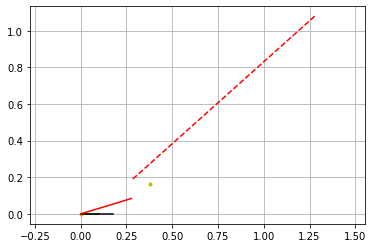

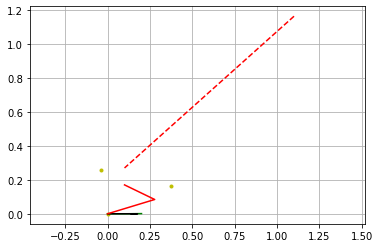

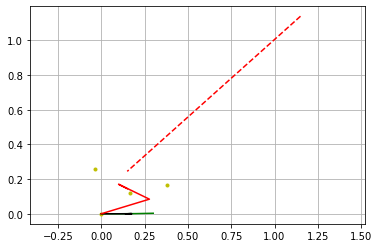

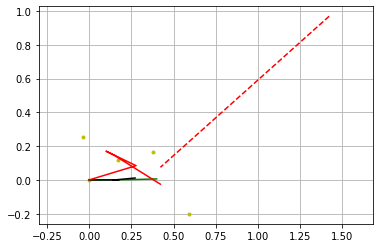

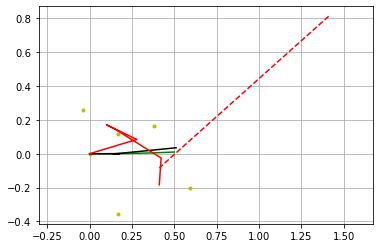

...

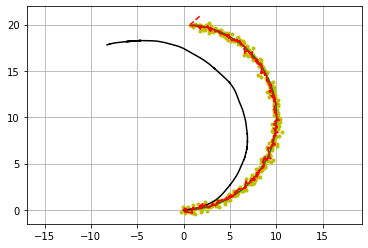

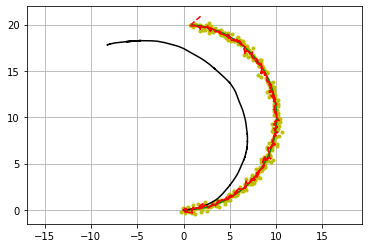

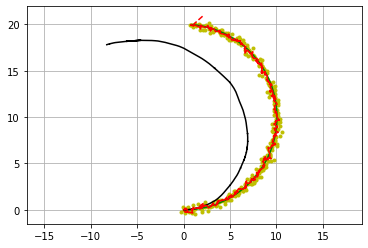

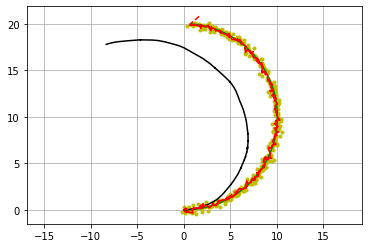

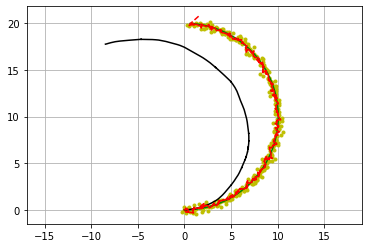

C:\Users\aplus\AppData\Local\Temp\ipykernel_34380\1197381427.py:11: RuntimeWarning: overflow encountered in matmul
  mu = A @ mu + B @ u
C:\Users\aplus\AppData\Local\Temp\ipykernel_34380\307897267.py:7: RuntimeWarning: invalid value encountered in matmul
  z = H @ x


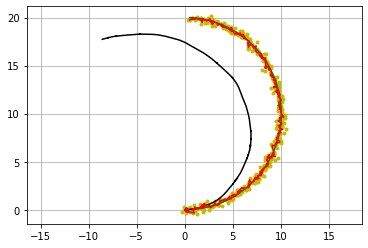

C:\Users\aplus\AppData\Local\Temp\ipykernel_34380\1197381427.py:11: RuntimeWarning: invalid value encountered in matmul
  mu = A @ mu + B @ u
C:\Users\aplus\AppData\Local\Temp\ipykernel_34380\307897267.py:7: RuntimeWarning: invalid value encountered in matmul
  z = H @ x


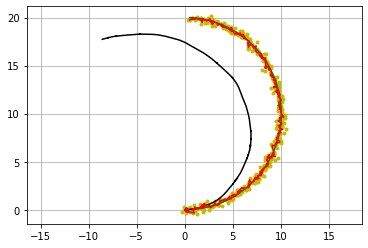

C:\Users\aplus\AppData\Local\Temp\ipykernel_34380\1197381427.py:11: RuntimeWarning: invalid value encountered in matmul
  mu = A @ mu + B @ u


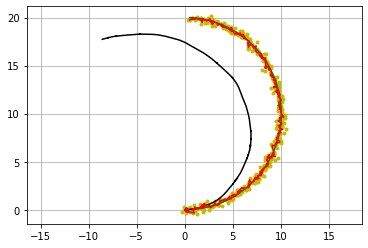

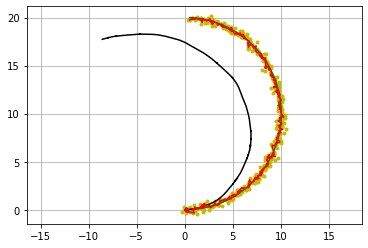

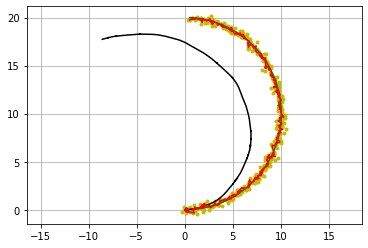

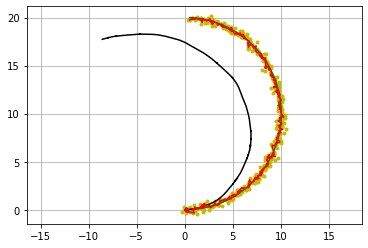

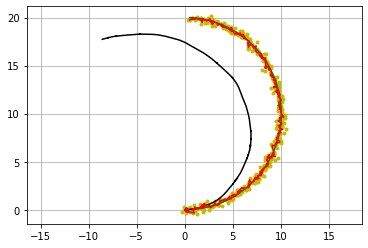

...

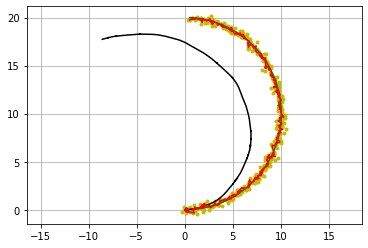

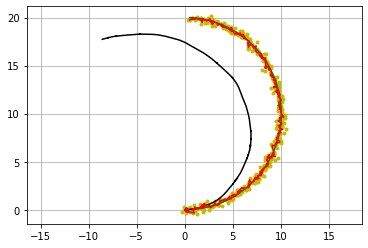

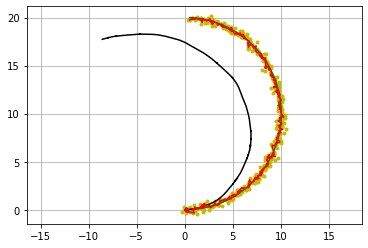

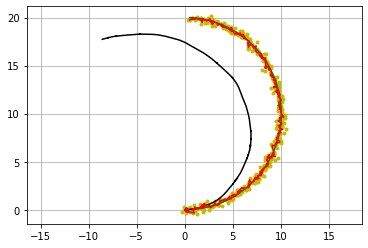

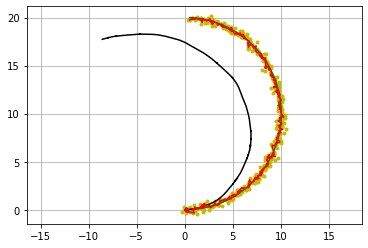

In [114]:
def main():
   
    
    time = 0.0
    x_e = np.zeros((4,1))
    x_t = np.zeros((4,1))
    p_e = np.eye(4)
    
    x_dead_r = np.zeros((4,1))
    
    hx_e = x_e
    hx_t = x_t
    hx_dead_r = x_t
    hz = np.zeros((2, 1))
    
    while Simulation_Time >= time:
        time += del_T
        u = control_command()

        x_t, z, x_dead_r, ud = observation(x_t, x_dead_r, u)

        x_e, P_e = ekf(x_e, p_e, z, ud)

        # store data history
        hx_e = np.hstack((hx_e, x_e))
        hx_dead_r = np.hstack((hx_dead_r, x_dead_r))
        hx_t = np.hstack((hx_t, x_t))
        hz = np.hstack((hz, z))

        if show_animation:
            plt.cla()
            plt.gcf().canvas.mpl_connect('key_release_event',
                    lambda event: [exit(0) if event.key == 'escape' else None])
            plt.plot(hz[0, :], hz[1, :], ".y")
            plt.plot(hx_t[0, :].flatten(),
                     hx_t[1, :].flatten(), "-g")
            plt.plot(hx_dead_r[0, :].flatten(),
                     hx_dead_r[1, :].flatten(), "-k")
            plt.plot(hx_e[0, :].flatten(),
                     hx_e[1, :].flatten(), "-r")
            covariance_ellipse(x_e, p_e)
            plt.axis("equal")
            plt.grid(True)
            plt.pause(0.001)


if __name__ == '__main__':
    main()